# Load the image data. 
* Load the image data and make a label based on their size. 

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
%matplotlib inline
cars = glob.glob('./vehicles/*/*.png')
notcars = glob.glob('./non-vehicles/*/*.png')
print('Number of vehicles images',len(cars))
print('Number of non-vehicles images',len(notcars))

Y = np.hstack((np.ones(len(cars)), 
              np.zeros(len(notcars))))
cars.extend(notcars)


Number of vehicles images 8792
Number of non-vehicles images 8968


# Extract features 
* We can extract features from data by Using following steps. 
    * (1) Using raw pixel value by reducing their size which is useful to detect image that are not varing their appearance.  
    * (2) Using histogram of colors to detect color difference between car & Non-car values. 
    * (3) HOG features to capture direction of the gradient. This impose strong value to the parts of image which show great variation in shape while impose small value to an parts of image where show small variation  by noise.  

### Using raw pixel
* Using raw pixel value of reduced size image. 


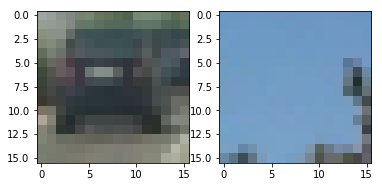

In [47]:
plt.subplot(121)
plt.imshow( cv2.resize((mpimg.imread(cars[0])),(16,16)))
plt.subplot(122)
plt.imshow( cv2.resize((mpimg.imread(notcars[0])),(16,16)))


### Using Color Histogram of the Image. 
* By comparing histogram of various color space we can verify that pixel value vary most in the hsv color space. 

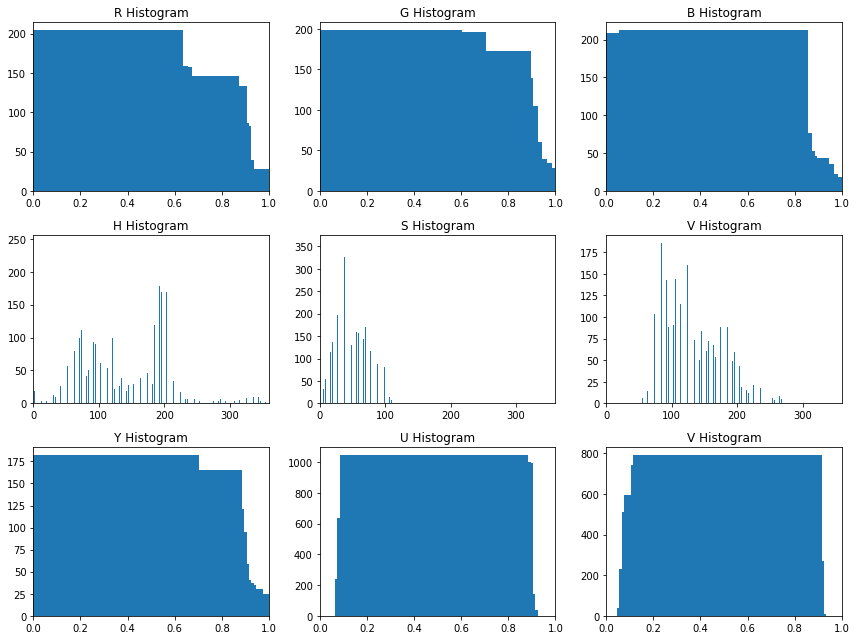

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

def color_hist(img, nbins=100, bins_range=[(0, 256)]):
    # Compute` the histogram of the RGB channels separately
    hhist = np.histogram(img[:,:,0],nbins,bins_range[0])
    shist = np.histogram(img[:,:,1],nbins,bins_range[1])
    vhist = np.histogram(img[:,:,2],nbins,bins_range[2])
    bin_edges = hhist[1]
    # Generating bin centers
    bin_centers = (bin_edges[1:] + bin_edges[0:len(bin_edges) - 1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((hhist[0], shist[0], vhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hhist, shist, vhist, bin_centers, hist_features


img = mpimg.imread("./vehicles/GTI_Far/image0000.png")
img_small_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_small_YUV = cv2.cvtColor(img,cv2.COLOR_RGB2YUV)

rh, gh, bh, bincen, feature_vec = color_hist(img, nbins=100, bins_range=[(0, 1),(0, 1),(0, 1)])
hh, sh, vh, bincen_hsv, feature_vec = color_hist(img_small_HSV, nbins=100, bins_range=[(0,360),(0,1),(0,1)])
yh, uh, vvh, bincen_yuv, feature_vec = color_hist(img_small_YUV, nbins=100, bins_range=[(0,1),(0,1),(0,1)])

# Plot a figure with all three bar charts


if rh is not None:
    fig = plt.figure(figsize=(12,9))
    plt.subplot(331)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 1)
    plt.title('R Histogram')
    plt.subplot(332)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 1)
    plt.title('G Histogram')
    plt.subplot(333)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 1)
    plt.title('B Histogram')
    
if hh is not None:
    plt.subplot(334)
    plt.bar(bincen_hsv, hh[0])
    plt.xlim(0, 360)
    plt.title('H Histogram')
    plt.subplot(335)
    plt.bar(bincen_hsv, sh[0])
    plt.xlim(0, 360)
    plt.title('S Histogram')
    plt.subplot(336)
    plt.bar(bincen_hsv, vh[0])
    plt.xlim(0, 360)
    plt.title('V Histogram')
    
if hsh is not None:
    plt.subplot(337)
    plt.bar(bincen_yuv, yh[0])
    plt.xlim(0, 1)
    plt.title('Y Histogram')
    plt.subplot(338)
    plt.bar(bincen_yuv, uh[0])
    plt.xlim(0, 1)
    plt.title('U Histogram')
    plt.subplot(339)
    plt.bar(bincen_yuv, vvh[0])
    plt.xlim(0, 1)
    plt.title('V Histogram')
    plt.tight_layout()



In [85]:
rh[0]

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         9,  40,  83, 161,  91, 132,  84, 125, 155, 105, 204, 112, 159,
       116, 157, 107, 120, 124,  82, 119,  77,  90,  56,  72,  46,  67,
        48,  55,  65,  26,  52,  40,  71,  71, 146,  95, 125, 133,  87,
        82,  40,  26,  19,  28,  13,  17,   9,  19,  28,  14,  10,   8,
         7,   7,   7,   6,  13,   5,   9,  14,   2,   3,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0])

### Get histogram of oriented gradients
* By capturing the intensity of the gradient in each region of image we can use it as features for classification model. 

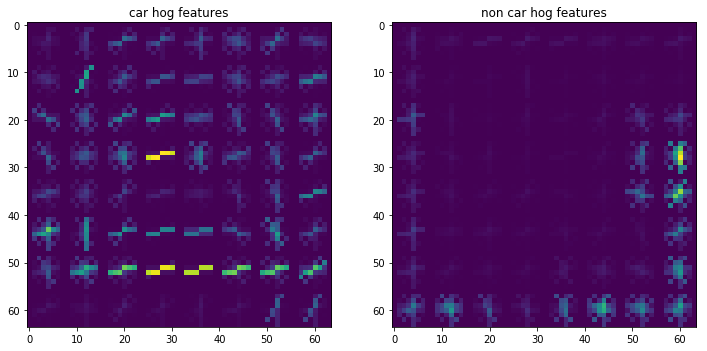

In [71]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block,
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient,
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  transform_sqrt=True,
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:
        features = hog(img, orientations=orient,
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       transform_sqrt=True,
                       visualise=vis, feature_vector=feature_vec)
        return features
    # Otherwise call with one output
orient = 9  # HOG orientations
pixel_per_cell = 8 # HOG pixels per cell
cell_per_block = (2,2) # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
car_example = mpimg.imread(cars[0])
hog_feat, car_img = get_hog_features(car_example[:,:,0],orient,pixel_per_cell,cell_per_block,True,True)
non_car_example = mpimg.imread(notcars[0])
hog_feat,non_car_img = get_hog_features(non_car_example[:,:,0],orient,pixel_per_cell,cell_per_block,True,True)
fig = plt.figure(figsize=(12,9))
plt.subplot(121)
plt.title('car hog features')
plt.imshow(car_img)
plt.subplot(122)
plt.title('non car hog features')
plt.imshow(non_car_img)

### Combining features 
* I choosed hsv as a color space which show greatest variation in histogram. 
* Choosed 9 orientations on HOG features. 8 pixel per cell and 2 cell per blocks as hog parameters. 
* Used 16 * 16 as a size for spatial features. 
* I tried to apply PCA on final features however it worse the implementation time which is crucial key for this project. So i decided not use PCA.

In [2]:
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.cross_validation import cross_val_score
from sklearn.pipeline import make_pipeline,make_union
from sklearn.decomposition import PCA
from sklearn.utils import shuffle

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block,
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient,
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  transform_sqrt=True,
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:
        features = hog(img, orientations=orient,
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       transform_sqrt=True,
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel()
    # Return the feature vector
    return features


# Define a function to compute color histogram features
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs,color_space='BGR', spatial_size=(32, 32),
                        hist_bins=32, orient=9,
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    num = 0 
 
        

    # Iterate through the list of images
    for image in imgs:
        num += 1
        file_features = []
        # Read in each one by one
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: 
            feature_image = np.copy(image)

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
            
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


class FeatureExtractor(object):
    
    def __init__(self):
        pass
    
    def transform(self,X,y = None,hog_feat = True):
        color_space = 'HLS' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
        orient = 9  # HOG orientations
        pix_per_cell = 8 # HOG pixels per cell
        cell_per_block = 2 # HOG cells per block
        hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
        spatial_size = (16, 16) # Spatial binning dimensions
        hist_bins = 32    # Number of histogram bins
        spatial_feat = True # Spatial features on or off
        hist_feat = True # Histogram features on or off
        hog_feat = True # HOG features on or off
        features = extract_features(X, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
        

        return features

    
    def fit(self,X,y = None):
        return self
# Define a function that takes an image,
# start and stop positions in both x and y,
# window size (x and y dimensions),
# and overlap fraction (for both x and y)


X = [ mpimg.imread(x) for x in cars]

X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=30)

SC = StandardScaler()
FE = FeatureExtractor()
FE.fit(X_train)
train_features = FE.transform(X_train)
train_features = SC.fit_transform(train_features)

/Users/hm/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


* Choosed Linear SVC as a model. 

In [3]:
svc = LinearSVC()
svc.fit(train_features,y_train)
test_features = FE.transform(X_test)
test_features = SC.transform(test_features)
print('test scores on test image',svc.score(test_features,y_test))

test scores on test image 0.988175675676


### Save variables to use for video streaming. 

In [4]:
np.save('train_features',train_features)
np.save('y_train',y_train)
np.save('test_features',test_features)
np.save('y_test',y_test)
#train_features = np.load('train_features2.npy')
#y_train = np.load('y_train2.npy')
#test_features = np.load('test_features2.npy')
#y_test = np.load('y_test2.npy')

In [5]:
import pickle
pickle.dump(FE,open('FE.sav', 'wb'))
pickle.dump(SC,open('SC.sav', 'wb'))
pickle.dump(svc,open('model_with_seperate.sav','wb'))
#pl1 = pickle.load(open('pl2.sav','rb'))
#svc = pickle.load(open('model3.sav','rb'))


# Transform Image by sliding windows. 
* To apply fitted SVC model from previous steps we need to follow these steps. 
    * (1) Get hog features of road image with center camera on the vehicle. 
    * (2) Slide image with pre-defined window size append spatials bins and color bins as featues with hog features from step1. 
    * (3) We can adjust window size. We need to use bigger windows on closer car and smaller windows on car with great distances. 
    * (4) If the decision function(distance from distance boundary) exeed 0.6 Decide this image as a vehicle and detect it.


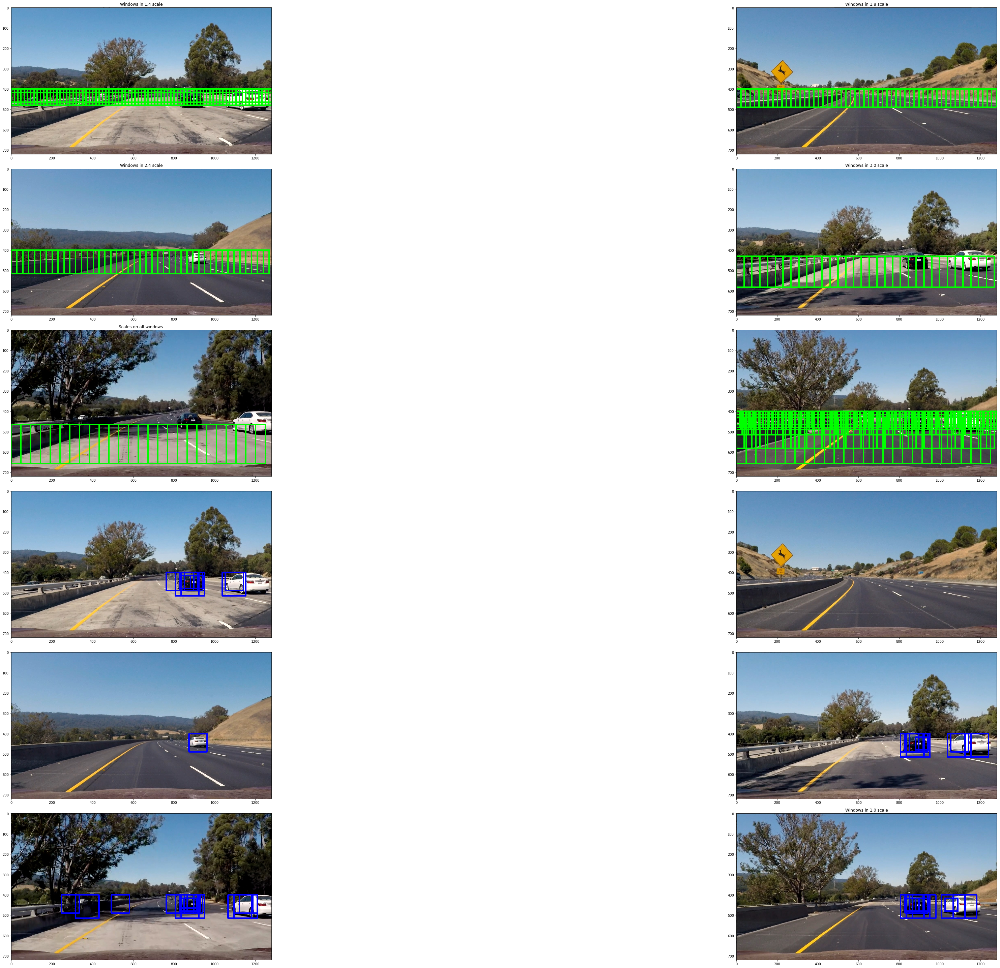

In [23]:
import matplotlib.pylab as plt
import matplotlib as mpl
import skimage
from skimage import data, color, exposure
from sklearn.decomposition import PCA
%matplotlib inline
import glob


def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def find_cars(img, ystart, ystop, svc , SC, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,scale  = 1.5,vis = False):
    img = img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    img_converted = cv2.cvtColor(img_tosearch,cv2.COLOR_RGB2HLS)
    if scale != 1:
        imshape = img_converted.shape
        img_converted = cv2.resize(img_converted, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    ch1 = img_converted[:,:,0]
    ch2 = img_converted[:,:,1]
    ch3 = img_converted[:,:,2]
    
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)+1  #-1
    nyblocks = (ch1.shape[0] // pix_per_cell)+1  #-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
      
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hot_windows = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
        
            # Extract the image patch
           
            subimg = cv2.resize(img_converted[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            test_features = SC.transform(np.hstack((spatial_features, hist_features,hog_features)).reshape(1, -1))    

            test_prediction = svc.decision_function(test_features)
            if vis: 
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                hot_windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))

                
            if test_prediction > 0.6 :
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                hot_windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))

                
                
    return hot_windows

def search_windows(img, windows, clf, pl1):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        test_features = pl1.transform(test_img.reshape(1,64,64,3))
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
def search_all_scales(image):
    
    hot_windows = []
    all_windows = []
    
    

    X_start_stop =[[None,None],[None,None],[None,None],[None,None]]
    w0,w1,w2,w3 = 240,180,120,70
    o0,o1,o2,o3 = 0.75,0.75,0.75,0.75
    XY_window = [(w0,w0),(w1,w1),(w2,w2),(w3,w3)]
    XY_overlap = [(o0,o0),(o1,o1),(o2,o2),(o3,o3)]
    yi0,yi1,yi2,yi3 = 380,380,395,405                  
    Y_start_stop =[[yi0,yi0+w0/2],[yi1,yi1+w1/2],[yi2,yi2+w2/2],[yi3,yi3+w3/2]]    
    
    for i in range(len(Y_start_stop)):
        windows = slide_window(image, x_start_stop=X_start_stop[i], y_start_stop=Y_start_stop[i], 
                            xy_window=XY_window[i], xy_overlap=XY_overlap[i])
        
        all_windows += [windows]        
        
        hot_windows += search_windows(image, windows,svc,pl2)
        
      

    return hot_windows,all_windows
def get_all_hotwindows(image):
    orient = 9  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    spatial_size = (16, 16) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins
    spatial_feat = True # Spatial features on or off
    hist_feat = True # Histogram features on or off
    hog_feat = True # HOG features on or off
    ystarts = [400,400,400,400,464]
    ystops =  [480,490,528,528,660]
    scales =  [1.0,1.4,1.8,2.4,3.0]
    hot_windows = []
    for idx in range(len(ystarts)):
        hot_windows.extend(find_cars(image, ystarts[idx], ystops[idx], svc , SC, orient,
                           pix_per_cell, cell_per_block, spatial_size, hist_bins,scales[idx],vis = False))
    return  hot_windows

 

test_imgs = glob.glob('./test_images/*.jpg')
test_imgs = [ mpimg.imread(x) for x in test_imgs]



all_windows = []
#image = test_imgs[0]'
rectangles = []

 

color_space = 'HLS' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
total_windows = []
ystarts = [400,400,400,430,464]
ystops =  [480,490,528,610,660]
scales =  [1.0,1.4,1.8,2.4,3.0]
fig, axarr = plt.subplots(6, 2,figsize= (80,40))
start_num = -1
for idx,image in enumerate(test_imgs): 
    draw_image = np.copy(image)
    if idx < 5: 
        all_windows = find_cars(image, ystarts[idx], ystops[idx], svc , SC, orient,
                               pix_per_cell, cell_per_block, spatial_size, hist_bins,scales[idx],vis = True)
       
        total_windows.extend(all_windows)
        axarr[start_num,plot_idx].set_title('Windows in {} scale'.format(scales[idx]))

    else: 
        all_windows = total_windows
        axarr[start_num,plot_idx].set_title('Scales on all windows.')

        
    windows_img = draw_boxes(draw_image, all_windows, color=(0,255,0), thick=6) 
    

    if (idx  % 2)  == 0 :
        start_num += 1
    plot_idx = idx - (2*start_num)
    axarr[start_num,plot_idx].imshow(windows_img)
    
    
for idx,image in enumerate(test_imgs): 
    idx = idx + 6
    draw_image = np.copy(image)
    hot_windows = get_all_hotwindows(image)
    windows_img = draw_boxes(draw_image, hot_windows, color=(0,0,255), thick=6) 

    if (idx  % 2)  == 0 :
        start_num += 1
    plot_idx = idx - (2*start_num)
    axarr[start_num,plot_idx].imshow(windows_img)
plt.tight_layout()
plt.show()

# Heatmap. 
* We can extract exact windows by applying thresholding on the detected windows based on their heatmap. 

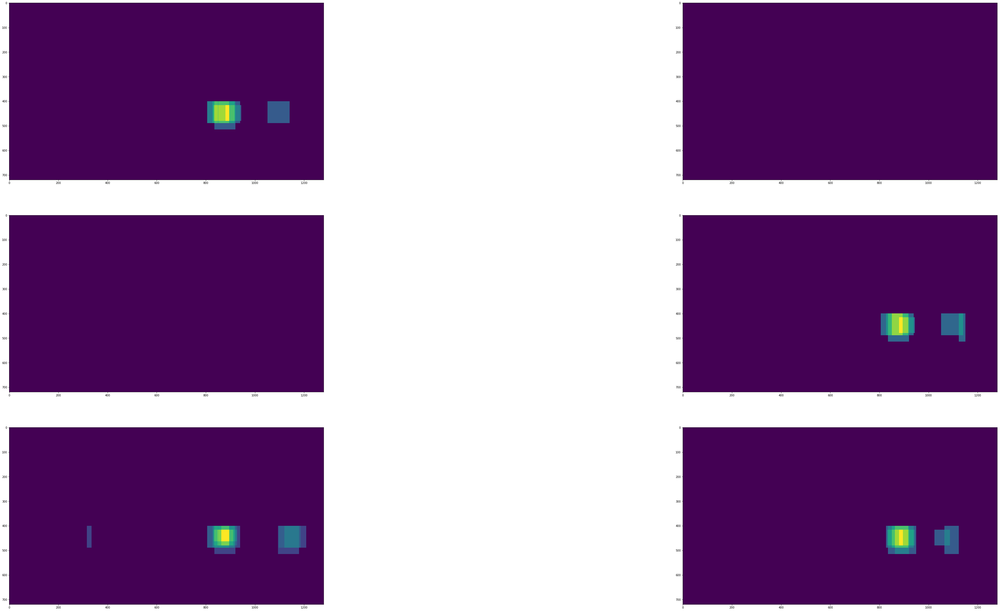

In [18]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from scipy.ndimage.measurements import label

# Read in a pickle file with bboxes saved
# Each item in the "all_bboxes" list will contain a 
# list of boxes for one of the images shown above

# Read in image similar to one shown above 


    
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img


# Visualize the heatmap when displaying    
# Find final boxes from heatmap using label function

fig, axarr = plt.subplots(3, 2,figsize= (80,40))
start_num = -1
heatmaps = []
for idx,image in enumerate(test_imgs): 
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    hot_windows= get_all_hotwindows(image)     
    heat = add_heat(heat,hot_windows)
    heat = apply_threshold(heat,1)
    heatmap = np.clip(heat, 0, 255)
    heatmaps.append(heatmap)

    if (idx  % 2)  == 0 :
        start_num += 1
    plot_idx = idx - (2*start_num)
    axarr[start_num,plot_idx].imshow(heatmap)
plt.show()


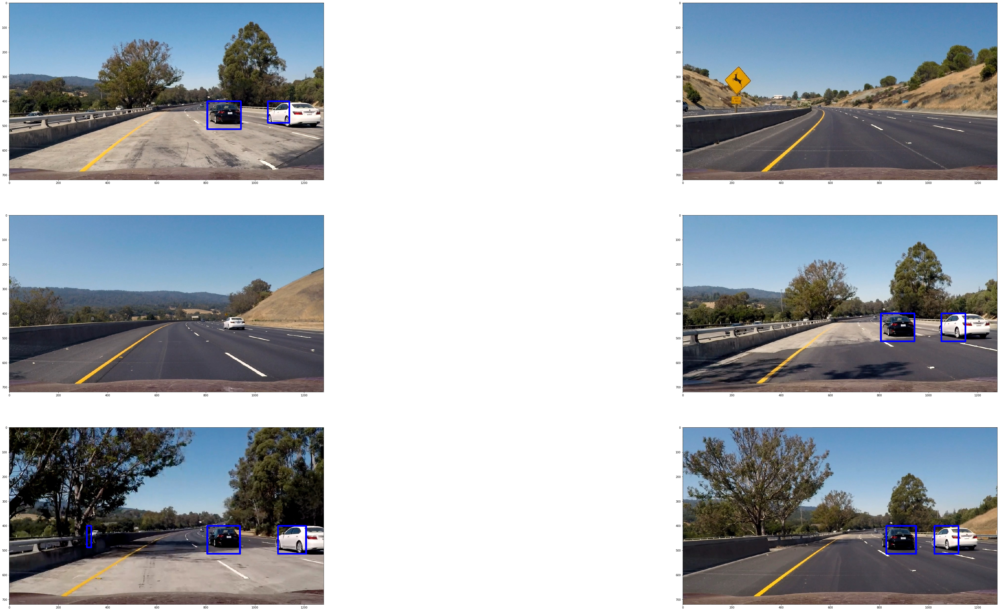

In [19]:
fig, axarr = plt.subplots(3, 2,figsize= (80,40))
start_num = -1
for idx,heatmap in enumerate(heatmaps): 
    draw_image = test_imgs[idx]
    labels = label(heatmap)
    window_img = draw_labeled_bboxes(draw_image, labels)
    if (idx  % 2)  == 0 :
        start_num += 1
    plot_idx = idx - (2*start_num)
    axarr[start_num,plot_idx].imshow(window_img)
plt.show()

# Define hot windows class
* I have defined hot window classes to update constantly for more robust detection of image. 
* By using recent 7 detected windows we can detect vehicles from video that show great signs. 

In [20]:
from collections import deque
class HotWindows():
    def __init__(self,n=7):
        
        # hot windows of the last n images
        self.recent_hots = deque(maxlen=n)
        # current boxes
        self.current_hots = None

    def add_new_hot(self,hot_windows):
        self.current_hots = hot_windows
        self.recent_hots.append(hot_windows)
    def return_current_hot(self):
         return [y for x in self.recent_hots for y in x]
            

HW = HotWindows()
def process_image(image):
    draw_image = np.copy(image) 
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    hot_windows = get_all_hotwindows(image) 
    HW.add_new_hot(hot_windows)
    heat = add_heat(heat,HW.return_current_hot())
    heat = apply_threshold(heat,4)
    heatmap = np.clip(heat, 0, 255)
    labels = label(heatmap)
    window_img = draw_labeled_bboxes(draw_image, labels)                   
    return window_img  

In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np



input_video = './project_video.mp4'
outfile= './processed_video.mp4'
clip = VideoFileClip(input_video)
out_clip = clip.fl_image(process_image) 
%time out_clip.write_videofile(outfile, audio=False)

[MoviePy] >>>> Building video ./processed_video.mp4
[MoviePy] Writing video ./processed_video.mp4


100%|█████████▉| 1260/1261 [08:17<00:00,  2.28it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./processed_video.mp4 

CPU times: user 7min 41s, sys: 47.5 s, total: 8min 29s
Wall time: 8min 17s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(outfile))